# Project Title Here

**Names**: Jing Rui, Yichao Zhao, Yiyang Xiong, Jipeng Yuan

You can delete and add as many code blocks as you like or change the formatting.

## 0. Import

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import warnings
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA, NMF
from sklearn.neighbors import NearestNeighbors
from sklearn.exceptions import ConvergenceWarning
from sklearn.mixture import GaussianMixture
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from skfuzzy.cluster import cmeans
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score


%matplotlib inline

# Adjust warning settings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore", category=ConvergenceWarning)

## 1. Introduction

## Research Introduction and Motivation
With the development of technology, the resolution of photos becomes higher and higher, which leads to huge pixel datasets. For instance, Ge'ez language has been used for centuries in Ethiopian churches for reading and interpreting the Bible, which makes it essential for the Ethiopian study. Its unique numbering system consists of complex shapes for each digit. In addition, the overlapping of symbols and the missing strokes also make it challenging to distinguishing and recognize all possible variations (Malhotra & Addis, 2024). As a result, we need to analyze the datasets efficiently and mine their information accurately.


Our primary motivation for clustering is to improve the efficiency of data processing. More specifically, clustering algorithms such as k-means and fuzzy c-means help us classify pixels or data points, which significantly reduces the workload of processing large datasets (Dehariya, Shrivastava, & Jain, 2010).

Second, we are motivated by how clustering improves image segmentation, a critical component of image analysis tasks such as object identification and remote sensoring. This improvement helps researchers to better understand image data.

One application of clustering techniques is to analyze materials from archaeological sites. For example, image segmentation and clustering can help researchers identify the characteristics of each ceramic type. In this case, the efficiency of categorizing ceramic objects increases (Lopez, Lira, & Hein, 2015).  

## Citations

Dehariya, V. K., Shrivastava, S. K., & Jain, R. C. (2010, November). Clustering of image data set using k-means and fuzzy k-means algorithms. In 2010 International conference on computational intelligence and communication networks (pp. 386-391). IEEE.

Malhotra, R., & Addis, M. T. (2024). End-to-end handwritten Ge’ez multiple numerals recognition using deep learning. SICE Journal of Control, Measurement, and System Integration, 17(1), 122–134. https://doi.org/10.1080/18824889.2024.2336682

Lopez, P., Lira, J., & Hein, I. (2015). Discrimination of ceramic types using digital image processing by means of morphological filters. Archaeometry, 57(1), 146-162.

## How research motivation impacts the desired type of clustering

Whether each clustering within a clustering is helpful since we want the numbers to represent clear number distinction with unique patterns for the number ancient people in Africa wrote, and minimize the risk of misclassification. Similarly, a fuzzy clustering is highly important since we encounter numbers that somehow look like each other, with fuzzy clustering, we can better explore variations in how humans write the same digit. In ancient times and over many years of history, handwritten numbers might be ambiguous due to degradation or unclear writing. In the same way, a dendrogram that displays a nested cluster relationship is significant due to the reason that dendrogram can show how similar handwritten digits are grouped together at lower levels, and how different digits gradually separate when we get to higher levels. This helps us understand which digits the system may have trouble distinguishing. In constrast, a clustering where at least one cluster was a singleton outlier is less important because each person has slightly different writing habits and styles, but overall the difference will not be significant because people want others to understand their handwriting and people expect each other to write the numbers. However, detecting outliers could be particularly useful for data cleaning or for identifying errors in data collection. ishing. 



## 2. Dataset Discussion

## Report

This dataset has 1000 rows and 785 columns. Our code was the selected and downloaded from the options that professor provided on April 15th, which was originally downloaded from [kaggle](https://www.kaggle.com/datasets/danjwu/afromnist/data) We randomly select 500 observations from train and test data as the our data. The dataset uploaded on Kaggle was originally artificially generated from the corresponding Unicode characters. Each row within this dataset is an image of Ge‘ez (Ethiopic) numbers. This dataset inclusive of ALL possible types of observations that could have been considered in this dataset. I plan to use all variables (pixel_0-pixel_783 and label) within the dataset. Our analysis of this dataset should be used with caution, as it is artificially generated. Specifically, the variation in handwriting styles in real-world scenarios is likely greater than represented here. Additionally, cultural differences in handwriting styles mean that these results should not be overly generalized. 
ence

In [210]:
df=pd.read_csv('ethiopic_MNIST_sample.csv') 
df_copy = df.copy()
df.head()

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783,label
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [211]:
# Function to move a column in DataFrame to a specified position
def move_column(df, col, pos):
    cols = df.columns.tolist()
    cols.insert(pos, cols.pop(cols.index(col)))
    return df[cols]

# Move column 'C' to the position before 'B'
df = move_column(df, 'label', 0)
df

,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [106]:
df.shape[0]

1000

## 3. Dataset Cleaning and Exploration

### Missing Value Detection and Cleaning

### Report

Our data does not have missing values, so we don't need to clean up missing values. Because we don't need to handle missing values, there aren't any downsides to clean up the missing values in our data. Since our resource is image data, we choose to use dendrogram instead of scatter plot to identify outliers. More specifically, we create a hierarchical agglomerative clustering with single linkage to identify potential outliers since this algorithm is sensitive to outliers. Most dissimilarity is around 5 but the largest dissimilarity is around 6.8, because of that, there are no significant outliers within this dataset. Because our data doesn't include outliers, we don't need to handle this situation. In this way, all of the applied clustering algorithms won't be affected by outliers. We apply KNN distance plot to identify potential noise. According to the KNN distance plot, the distribution of distances from each point in your dataset to its k-nearest neighbors increases gradually without sudden increase, which suggests the noise does not exist in our data. We think the above steps have processed the data thoroughly and are well-prepared for starting formal data analysis.


In [107]:
(df.isnull().sum()).sum() # count the number of missing value (NaN) within the data 

0

### Outlier Identification - 3+ Variable Outliers

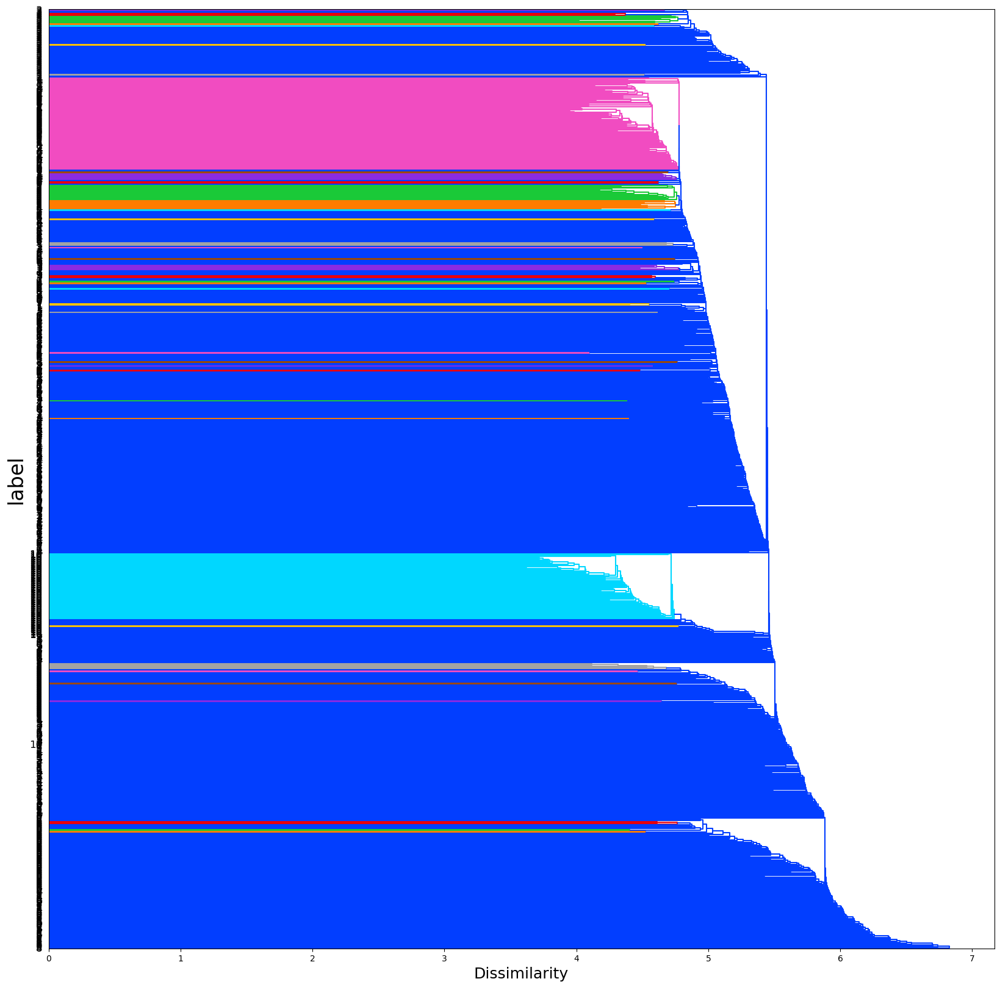

In [108]:
X_original=df.copy().drop(['label'], axis=1)/255 

dm = pdist(X_original, metric='euclidean')
Z = linkage(dm, method='single')

fig, ax = plt.subplots(figsize=(20, 20))
d = dendrogram(Z, orientation='right', labels=df['label'].array, ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('label', fontsize=24)
plt.yticks(fontsize=12)
plt.show()

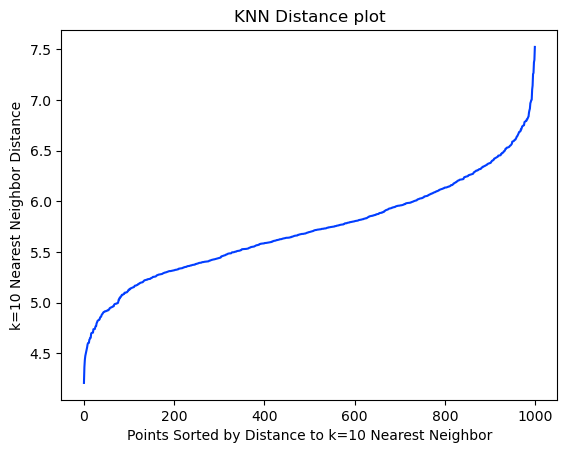

In [109]:
for k in range(10,11):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(X_original)
    distances, indices = nbrs.kneighbors(X_original)

    plt.plot(np.sort(distances.T[k-1]))

    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('KNN Distance plot')
    plt.show()

## 4. Basic Descriptive Analytics

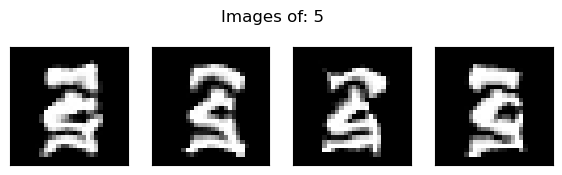

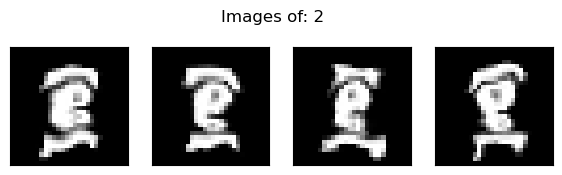

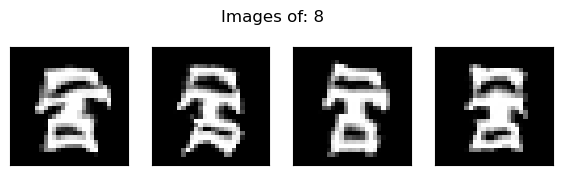

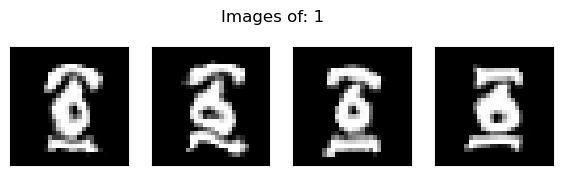

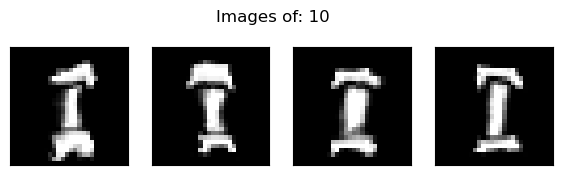

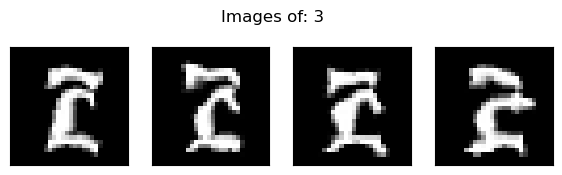

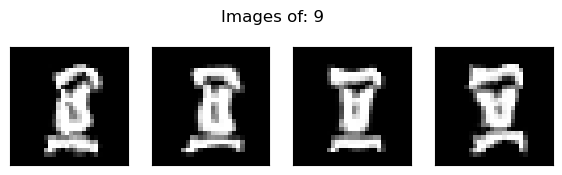

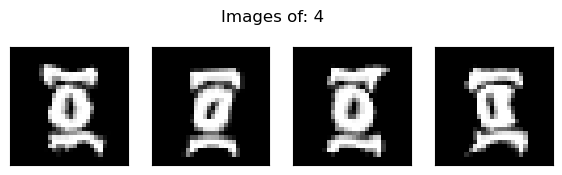

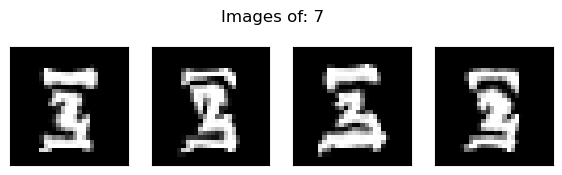

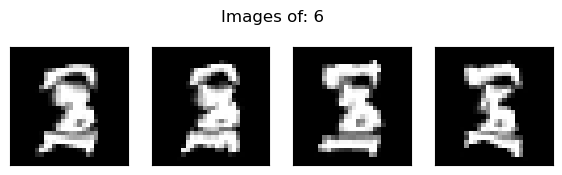

In [215]:
# Visualize the first few images of each type of class-label.
num_list=df['label'].drop_duplicates()
num_list

X_original=df.copy().drop(['label'], axis=1)/255 

for num in num_list:
    
    #Find just the rows in X that are an image of this particular number item
    df_item_subset=X_original[df['label']==num]
    
    #Set up the plot
    fig, ax = plt.subplots(1, 4, figsize=(7, 2)) 
    plt.suptitle('Images of: '+ str(num))  ##
    
    #Visualize the first four images that are of this number item
    for i in range(0,4):
        #First, reshape the flattened 784 pixel array into an 28-by-28 numpy array and unscale the data (ie. multiply by 255)
        object_image = np.array(df_item_subset.iloc[i]).reshape((28, 28))*255
        
        #Then show the image
        ax[i].imshow(object_image, cmap='gray')
        ax[i].grid(False)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
    plt.show()

Item 1: In this group of images, all of the images have similar elementary shapes. The second element (image) is different from other images in the way that this element has a tilted bottom and lower part.

Item 2: Most of the images in this group have the same shape. The fourth image has the highest discrepancy compared to others because its style of the middle part is different.

Item 3: This image shows medium variability. The last element shows the largest difference. The medium part of the original image looks like letter "L", but the corresponding part within the fourth image looks like a "C"

Item 4: This image shows medium variability. The middle part of all elements is highly similar to each other. However, the last one shows the largest discrepancy. More specifically, the middle part is tilted to the left side compared to other elements.

Item 5: This group of images show huge differences. The bend degree of each image differs from each other a lot. The largest differences is embodied at the third element that has the most prominent bend upper part.

Item 6: Most of the image for digit 6 showed small differences. The image between the horizon line on the top and bottom showed some similarities to digit 1, but there is a significant different on the top left part of the graph, making the graph unique in all the digits.

Item 7: In this group of images, the line of the third image at the bottom is thicker than others. the line of the fourth image at the bottom is a little bit curved.

Item 8: In this group of images, most of the images in this group have the same shape. But the line in the middle of the first image slants to the upper right. The second image has less space at the bottom

Item 9: The variability seems relatively large with major differences on the two horizontal lines that some lines are flat while some lines are undulating. In addition, the symbols among the two lines are slightly different in shape.

Item 10: The major difference is the thickness of the two horizontal lines of each observation as well as the symbol among the lines, and the shapes have some inor differences.


## 5.Scaling Decisions

## Report

Since the pixel values may vary from 0 to 255, the calculations may be less accurate compress to smaller numerical values. By dividing each pixel by 255, since the maximum pixel value in an 8-bit image is 255, the pixel values are normalized to the range [0, 1]. We didn’t choose to use z-score scaling because we consider some pixel (pixel in the center of the image) varies more frequently than the pixel at the left top corner. Hence, instead of giving same weight to all pixels, we decided to give heavier weight to some pixel (attribute) than other and didn't apply z-score scaling.


In [111]:
X_original=df.copy().drop(['label'], axis=1)/255  # variable scaling 
X_original.head()

X_complete = pd.concat([df["label"], X_original], axis=1)  # add the "label" column back 
X_complete.head()

,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 6. Clusterability and Clustering Structure Questions

## Report
Our analysis of the T-SNE plots suggest that the dataset is clusterable with 6 spherical clusters. The two clusters in the middle, one consisting of observations from label 1, 2, 4, 9, and the other one consisting of observations from label 6, 7, are relatively larger than the rest clusters, and those two clusters are not well-separated that they share some straddle nodes. Other than those two clusters, the others are well-separated. The cluster consists of 6, 7 may contain nested clusters. There is evidence of a nested cluster relationship in this dataset. For example, in the t-SNE plot with perplexity=50, the observations with label 6 and label 7 form a main cluster, but this main cluster consists of two smaller and not well separated clusters, which implies there is a nested cluster relationship in this dataset.

Some clusters consist of the observations from only one label, which suggests there are strong associations between each of the attributes and the clustering structure suggested by the t-SNE plot.

There are some properties of t-SNE plot (1) The sparsity of the clusters can not be preserved in the projection. (2) The distance between clusters in the projection is also not preserved. (3) The location of the points in the projection are also no proportional or preserved compared to the original points in the original dataset. (4) The existence of noise or outliers in the original dataset. (5) The centroid or other summary statistics of the original clustes. 


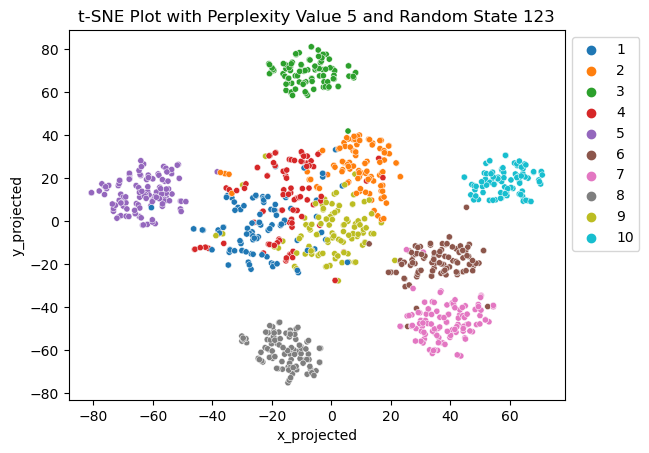

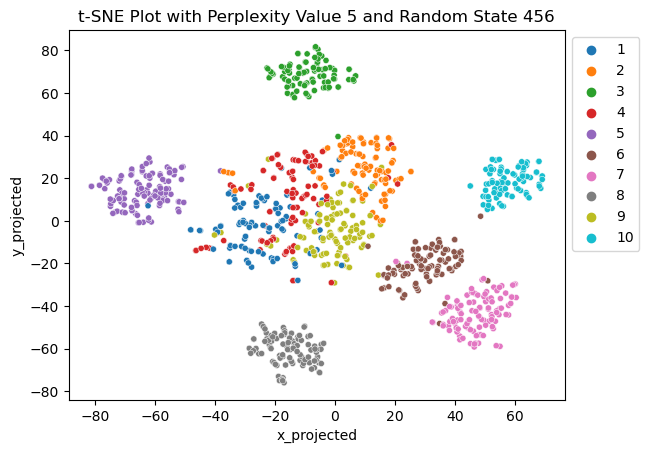

--------------------------------------------


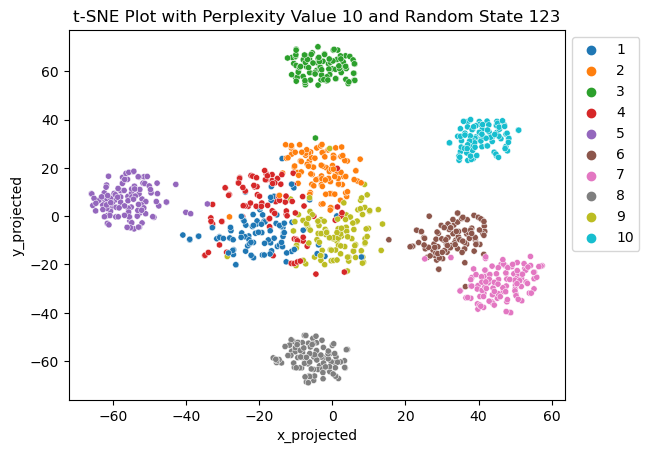

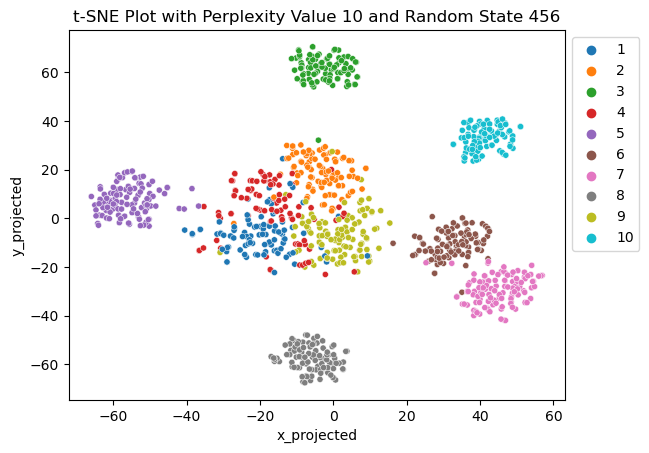

--------------------------------------------


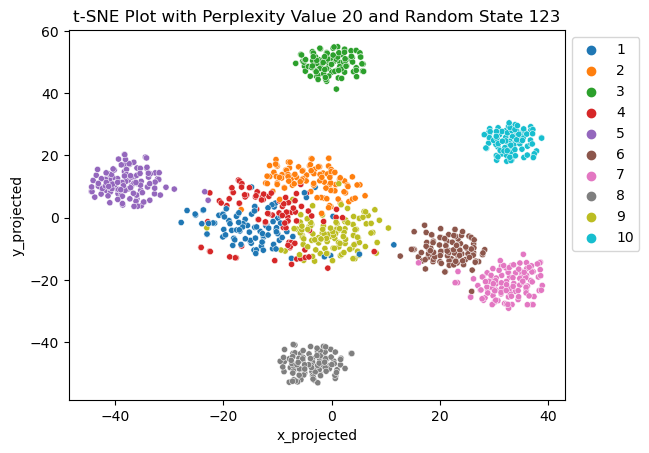

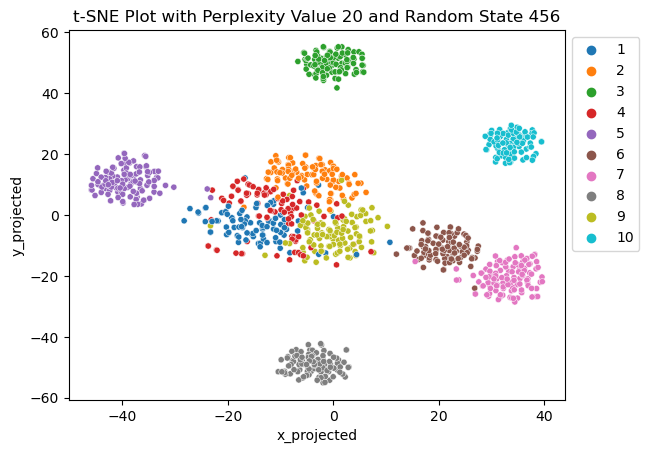

--------------------------------------------


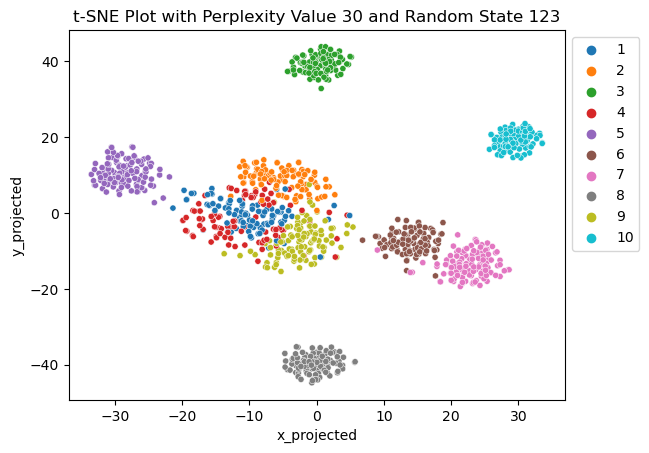

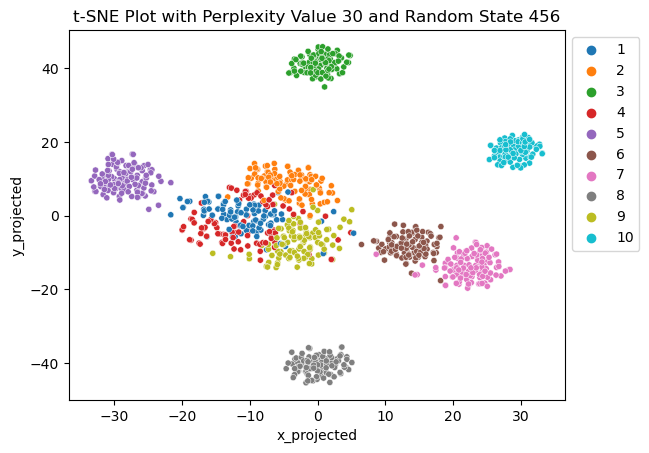

--------------------------------------------


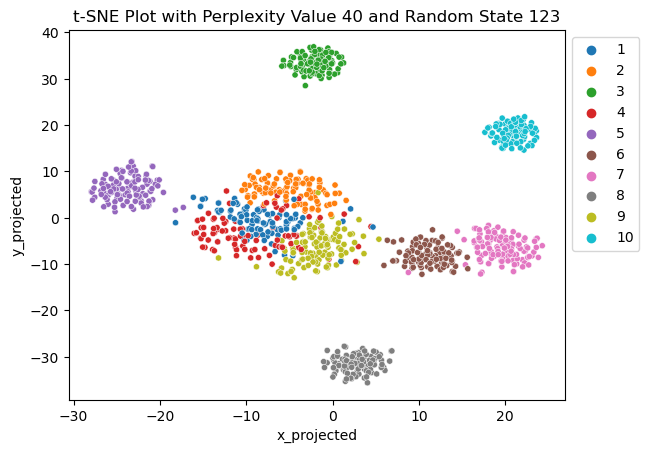

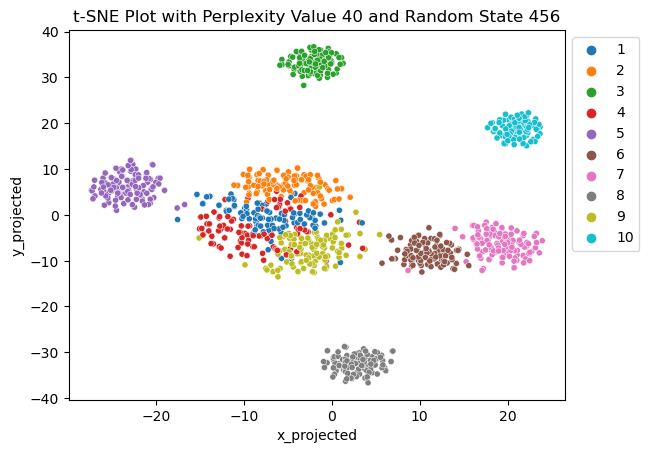

--------------------------------------------


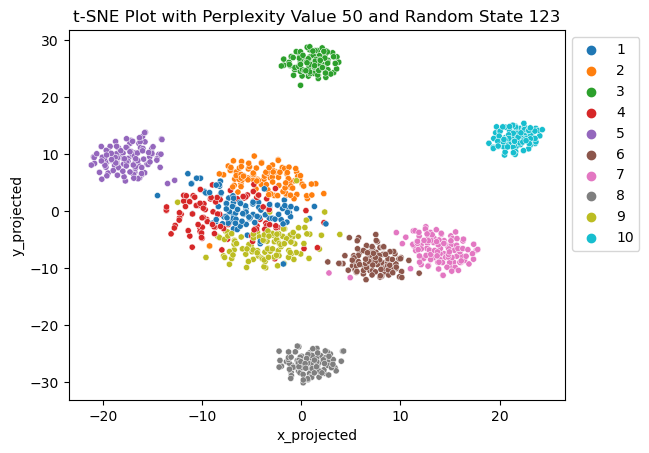

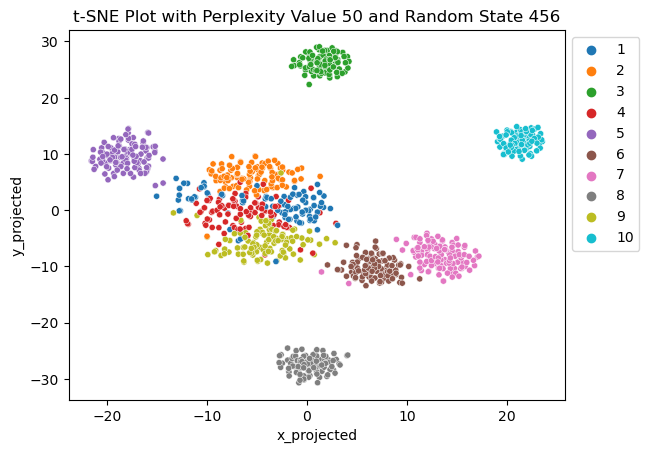

--------------------------------------------


In [112]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [123,456]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(X_original)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([X_complete, df_tsne], axis=1)
        palette = sns.color_palette("tab10")
        sns.scatterplot(x='x_projected',y='y_projected', hue='label', data=df_combo, s=20, alpha=1, palette=palette)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

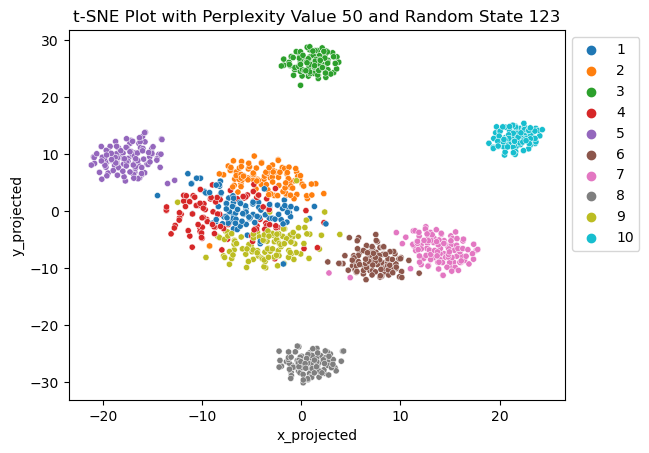

In [113]:
tsne = TSNE(n_components=2, perplexity=50, random_state=123)
data_tsne = tsne.fit_transform(X_original)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([X_complete, df_tsne], axis=1)
palette = sns.color_palette("tab10")
sns.scatterplot(x='x_projected',y='y_projected', hue='label', data=df_combo, s=20, alpha=1, palette=palette)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 123))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

## 7. Clustering Algorithm Selection Motivation

The first clustering algorithm we use is fuzzy-c means clustering. This method fits with our research motivation since our original study motivation is dedicated to work even under the situation that there is some overlapping characteristic between different Ge‘ez (Ethiopic) number. Additionally, there is some ideal property make this clustering algorithm appropriate. For instance, the observation from label 1, 2, 4, 9 overlap with each other in the t-SNE plot, which make fuzzy-c means become an ideal algorithm.

Secondly, we use k-mean clustering algorithm. Given that most clusters in the T-SNE plot are well-separated, spherical, we think the k-means algorithm would be a good fit to our dataset. In addition, the k-means elbow plot shows that there are 6 clusters, which aligns with our analysis of the T-SNE plot. Although the cluster sparsity has some slight differences, we still consider the overall situation ideal for k-means clustering. The benefits of k-means clustering is its simplicity and efficiency, which meets our research motivation to improve the efficiency of data processing. Also, k-means clustering are sensitive to outliers, which can be applied to real world analysis to identify errors in data collection.

Yes. The t-SNE implies some observations overlapping with each other, which makes the hard assignment clustering might not be the ideal choice given this circumstance. Hence, using fuzzy clustering is more beneficial in this case. Applying fuzzy clustering make our analysis result more generablizable especially when the original image data contain fuzzy information (different number image share some similarities)

Using hierarchical clustering would be beneficial in this case for some reasons. Hierarchical clustering allows us to visualize the relationship between observations with different labels. In this case, we can have a more thorough understanding the common features and texts shared by different Ge‘ez (Ethiopic) number.

## 8. Clustering Algorithm #1: fuzzy c means 

## Report

The original data consist of 10 different labels, but the t-SNE plot and fuzzy-c means elbow plot suggests 6 clusters. Hence, we decide to use 6 clusters in the fuzzy-c-means clustering algorithm. Here is the specific reason why we do so: during the process that we reduced the number of clusters from 10 to 6, we found the observations from label 1, 2, 4, 9 were counted as one cluster, the same thing happens to observations from label 6 and 7. So we decided to use 6 clusters instead of 10 clusters.

We are determined to use p = 1501 because the fuzzy c mean under this setting is able to identify some clusters suggested by the t-SNE plot. Whilst some clusters location does not align well with the t-SNE plot, one thing we need to notice is that t-SNE does not preserve the location of original dataset observatio 

We choose the cluster number parameter "c" in the fuzzy-c mean algorithm by using two methods: average silhouette score and t-SNE plot. According to the t-SNE plot, there are 6 clusters. According to the average silhouette score, the reasonable number of clusters i 

Given the research objectives of this analysis, we will choose to use c=6 clusters and the fuzzy c-means method with p=1.05. While we can gain some insight from many p-values, we will choose to use the fuzzy clustering method with p=1.05 because it allows us to categorize objects with relatively certain membership in most cases, reflecting the uncertainty in the assignment of clusters "across nodes," and also to determine more information about which clusters are more fuzzy than others. 123. 

There is some reason to believe the silhouette plot is not the best technique to use to measure the cohesion and separation of your clusters. More specifically, our image data is high-dimensional data, and the high-dimensional space is usually influenced by "curse of dimensionality" where the distance between pairs of observation become less distinguishable in this situation, so the silhouette plot becomes less meaningful and interp

Inside these 6 Image of centroid, the diagrams with numbers originally labeled 1, 2, 4, and 9 were consolidated in the diagram of centroid 3, and the diagrams with numbers originally labeled 6 and 7 were consolidated in the image of centroid 1. It follows that it is reasonable to categorize our metadata into 6 clusterseck this.

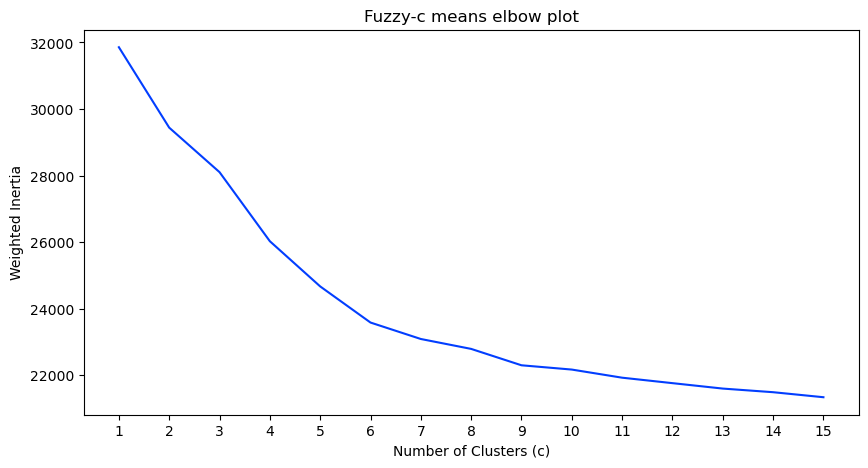

In [114]:
results = []
cs = range(1, 16) 

for c in cs:
    centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(
        X_original.T, c=c, m=1.01, error=1e-6, maxiter=20000, seed=100
    )
    results.append(history[-1]) 

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(cs, results)
plt.title('Fuzzy-c means elbow plot')
plt.xlabel('Number of Clusters (c)')
plt.ylabel('Weighted Inertia')
plt.xticks(cs)  
plt.show()

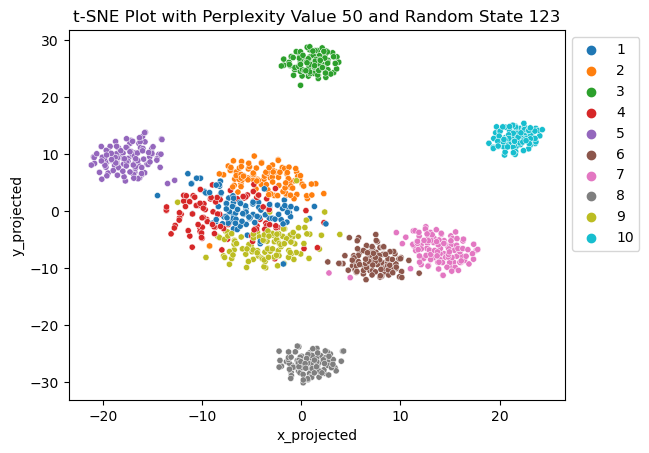

In [115]:
tsne = TSNE(n_components=2, perplexity=50, random_state=123)
data_tsne = tsne.fit_transform(X_original)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([X_complete, df_tsne], axis=1)
palette = sns.color_palette("tab10")
sns.scatterplot(x='x_projected',y='y_projected', hue='label', data=df_combo, s=20, alpha=1, palette=palette)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 123))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

## p = 1.01

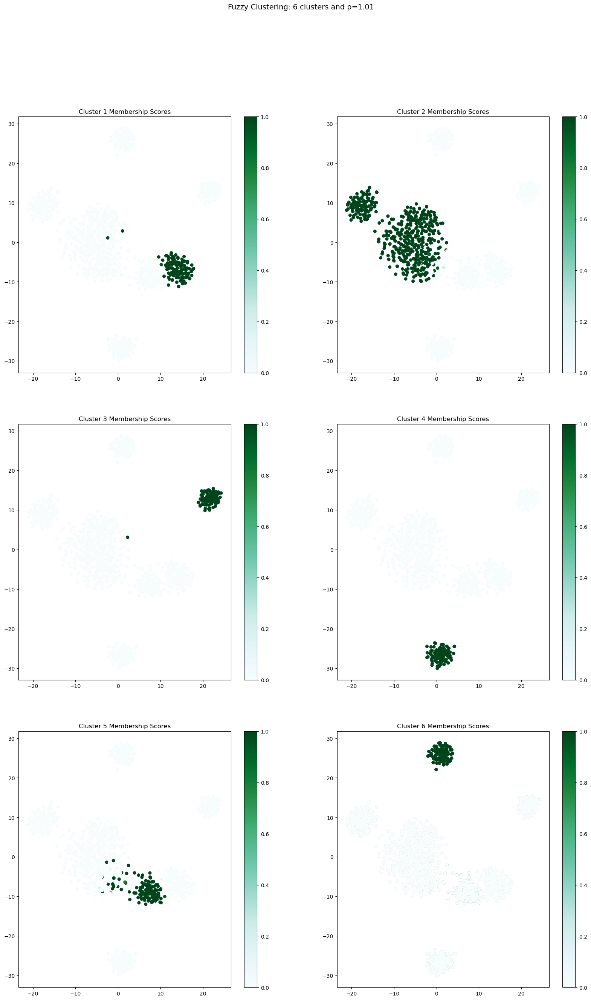

In [116]:
c=6
p=1.01

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,6):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

## p = 1.05

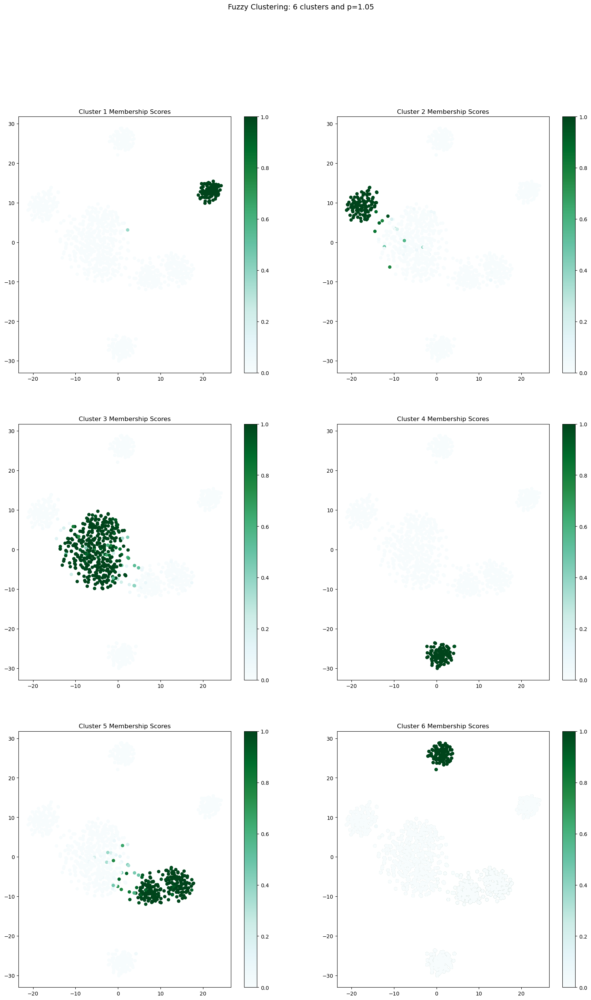

In [117]:
c=6
p=1.05

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,6):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

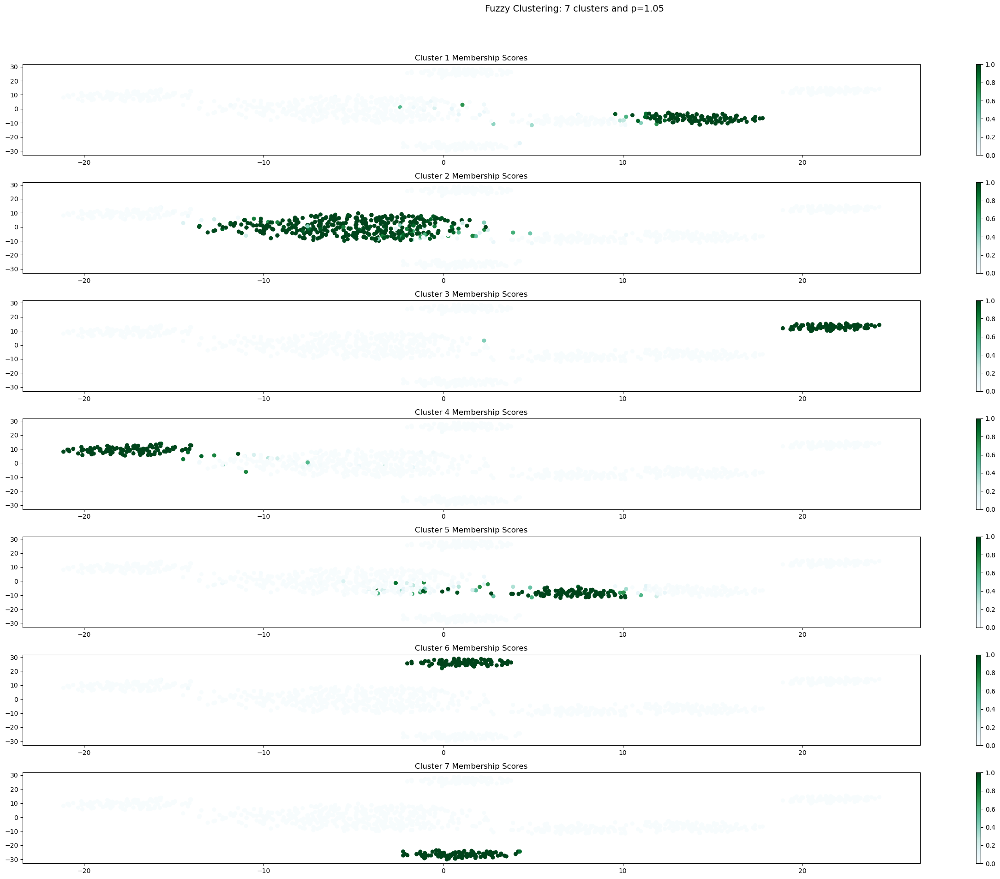

In [118]:
c = 7
p = 1.05

# Assuming cmeans and the required data are correctly imported and prepared
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

# Color code t-SNE Plots
fig, ax = plt.subplots(7, 1, figsize=(25, 20))
plt.suptitle(f'Fuzzy Clustering: {c} clusters and p={p}', fontsize=14)

for i in range(c):

    # Create a column with cluster i membership scores
    df_combo[f'Cluster {i} Membership Score'] = W[i, :]

    # Plot the points, color coded by the membership score.
    points = ax[i].scatter(df_combo["x_projected"], df_combo["y_projected"],
                           c=df_combo[f'Cluster {i} Membership Score'],
                           s=30, cmap="BuGn", vmin=0, vmax=1)

    fig.colorbar(points, ax=ax[i])
    ax[i].set_title(f'Cluster {i + 1} Membership Scores')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the title
plt.show()


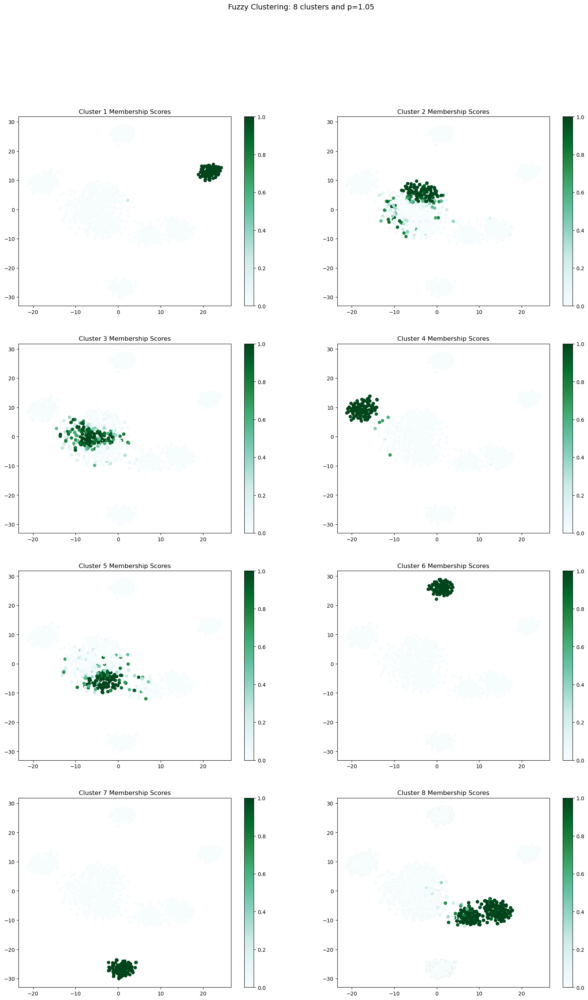

In [119]:
c=8
p=1.05

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(4, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,8):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

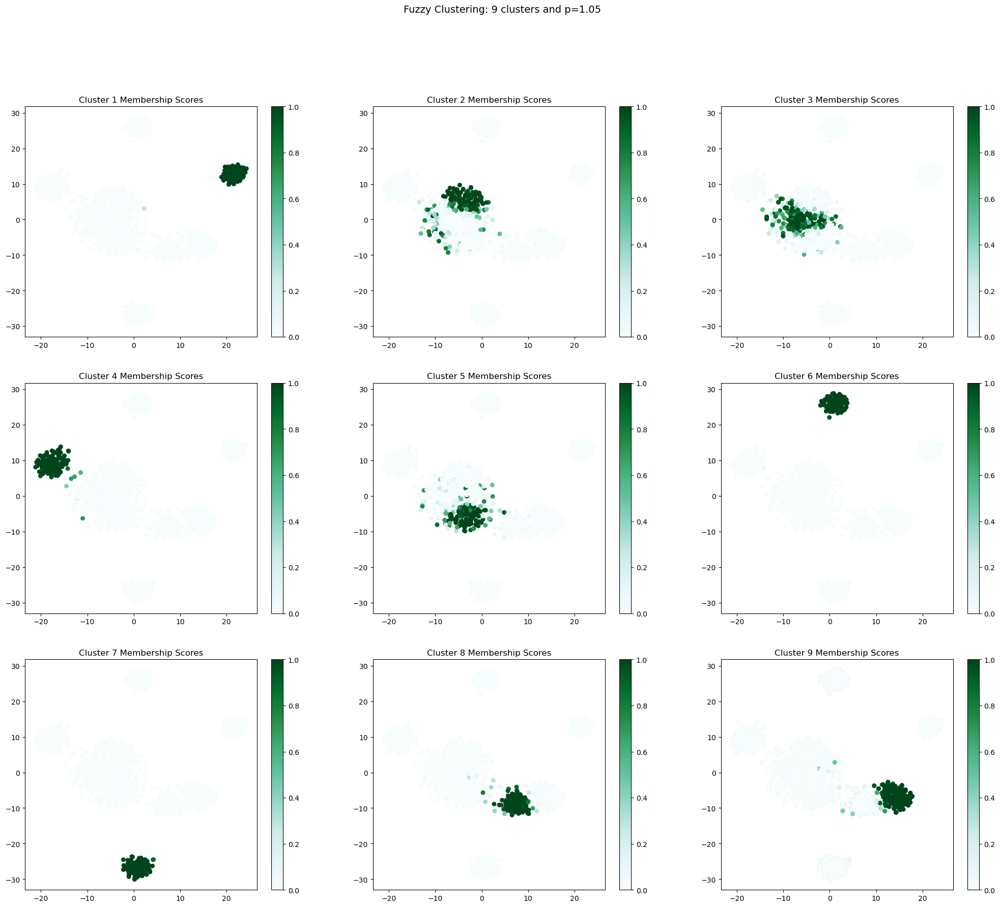

In [120]:
c=9
p=1.05

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(3, 3, figsize=(25, 20))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,9):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/3)),int(i%3)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/3)),int(i%3)])
    ax[int(np.floor(i/3)),int(i%3)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

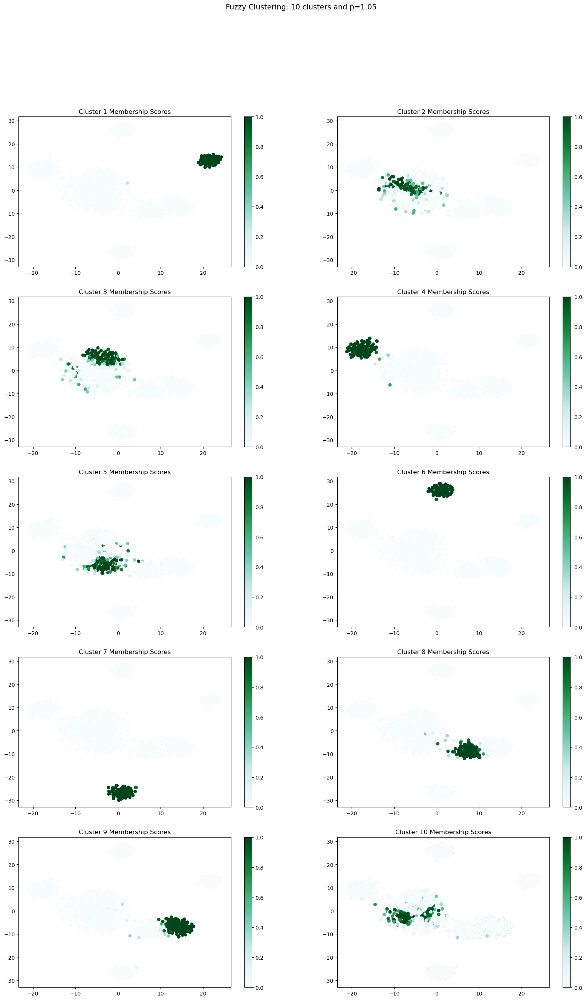

In [121]:
c=10
p=1.05

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(5, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,10):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

## p = 1.1

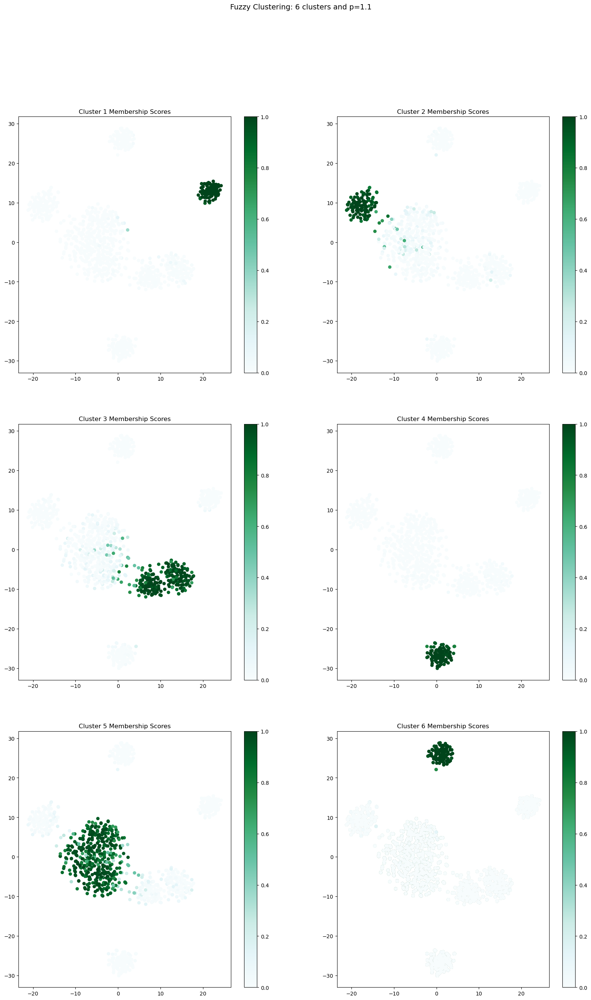

In [122]:
c=6
p=1.1

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,6):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

## p = 1.5

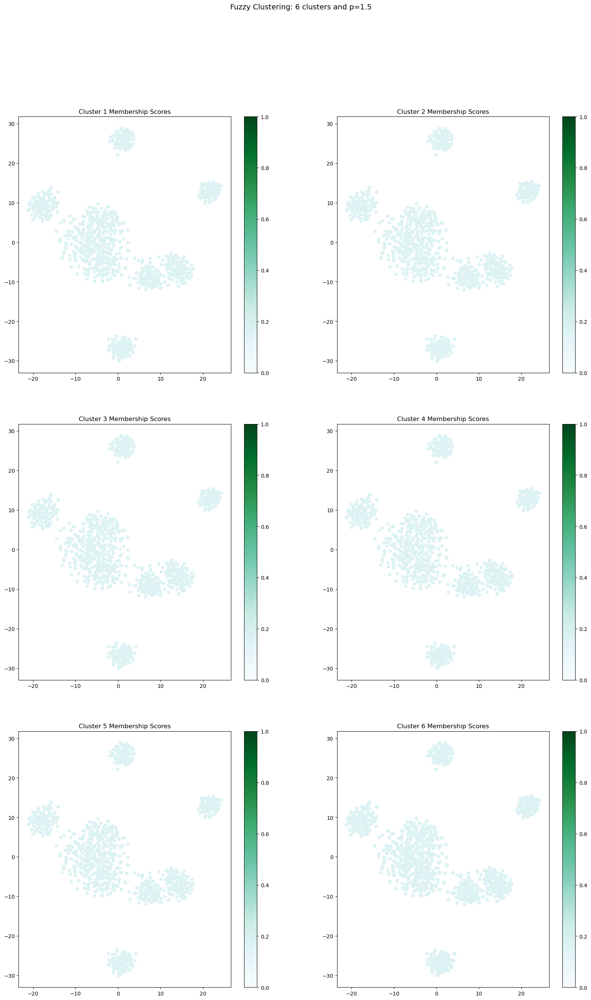

In [123]:
c=6
p=1.5

centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=c, m=p, error=1e-6, maxiter=20000, seed=123)

#Color code t-SNE Plots
fig, ax = plt.subplots(3, 2, figsize=(20, 30))
plt.suptitle('Fuzzy Clustering: %s clusters and p=%s'%(c,p), fontsize=14)
for i in range(0,6):

    #Create a column with cluster i membership scores
    df_combo['Cluster %s Membership Score'%str(i)]=W[i,:]

    #Plot the points, color coded by the membership score.
    points = plt.scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                         s=30, cmap="BuGn",
                        vmin=0,
                        vmax=1)
    ax[int(np.floor(i/2)),int(i%2)].scatter(df_combo["x_projected"], df_combo["y_projected"],
                 c=df_combo['Cluster %s Membership Score'%str(i)],
                                            s=30, cmap="BuGn",
                                           vmin=0,
                                           vmax=1)

    fig.colorbar(points, ax=ax[int(np.floor(i/2)),int(i%2)])
    ax[int(np.floor(i/2)),int(i%2)].set_title('Cluster %s Membership Scores'%(str(i+1)))
plt.show()

# similarity matrix 

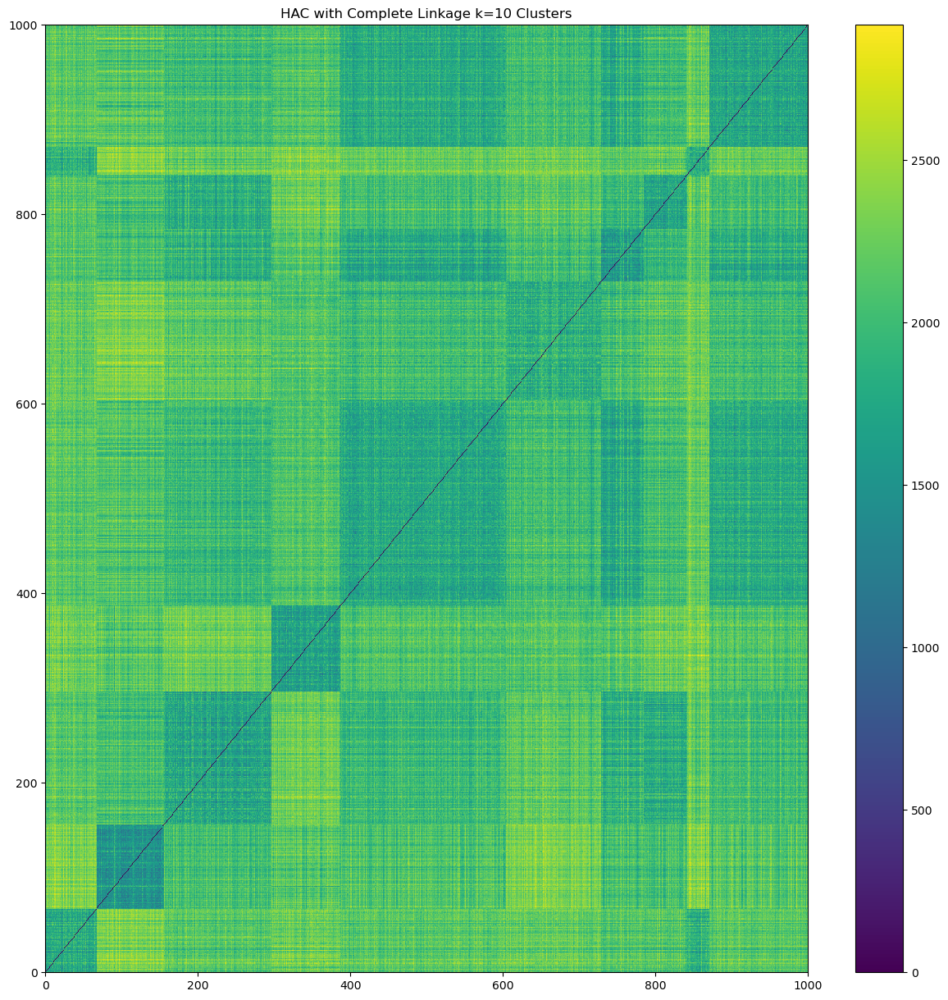

In [124]:
for k in range(10,11):
    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, linkage='complete')
    df['predicted_cluster'] = hac.fit_predict(X_original)
    
    df_sort = df.sort_values(by=['predicted_cluster'])
    df_sort = df_sort.drop(['predicted_cluster'], axis=1)
    #Create a distance matrix
    dist_mat = squareform(pdist(df_sort))

    #Then visualize the distance matrix with a heat map.
    plt.figure(figsize=(15,15))
    plt.pcolormesh(dist_mat)
    plt.colorbar()
    N = len(df_sort)
    plt.xlim([0,N])
    plt.ylim([0,N])
    plt.title('HAC with Complete Linkage k=%s Clusters'%(k))
    plt.show()

# silhouette plot

For n_clusters = 10 The average silhouette_score is : 0.0924507243710873


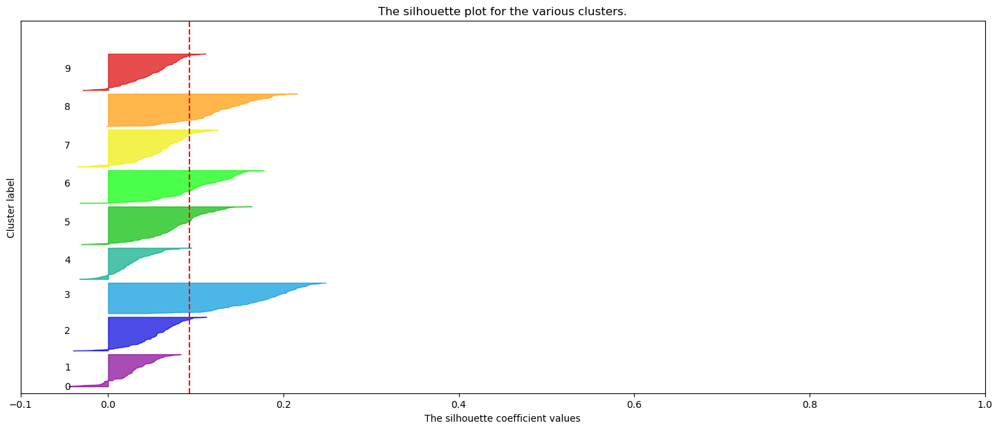

In [125]:
def show_silhouette_plots(X, cluster_labels):
    # This package allows us to use "color maps" in our visualizations
    import matplotlib.cm as cm

    # How many clusters in your clustering?
    n_clusters = len(np.unique(cluster_labels))

    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

    return

show_silhouette_plots(X_original,df['label'])

# KNN Distance plot

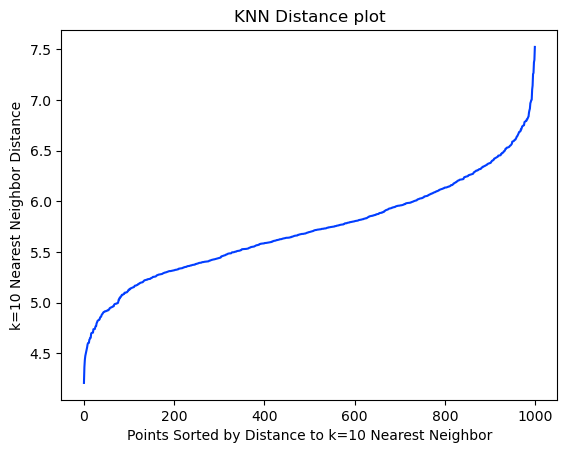

In [126]:
for k in range(10,11):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(X_original)
    distances, indices = nbrs.kneighbors(X_original)

    plt.plot(np.sort(distances.T[k-1]))

    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('KNN Distance plot')
    plt.show()

# Image average of each cluster 

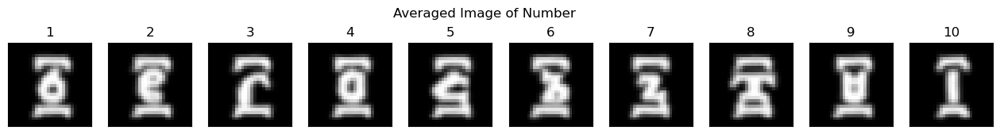

In [221]:
df_item_averages=df_copy.groupby(['label']).mean()

#Set up the plot
i=0
fig, ax = plt.subplots(1, 10, figsize=(16, 2))
plt.suptitle('Averaged Image of Number')

for num in sorted(list(num_list)):
    #First, reshape the flattened 784 pixel array into an 28-by-28 numpy array and unscale the data (ie. multiply by 255)
    object_image = np.array(df_item_averages.loc[num]).reshape((28, 28))*255

    #Then show the image
    ax[i].imshow(object_image, cmap='gray')
    ax[i].grid(False)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(str(num))
    
    i+=1
plt.show()

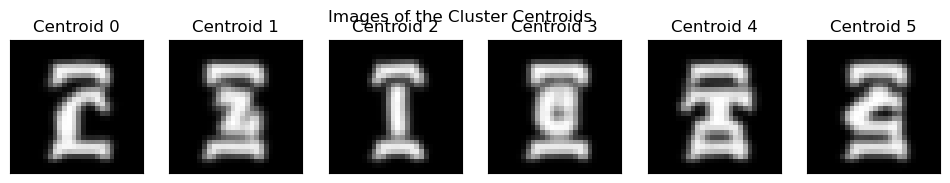

In [128]:
#Set up the plot
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=6, m=1.05, error=1e-6, maxiter=20000, seed=100)

fig, ax = plt.subplots(1, 6, figsize=(12, 2))
plt.suptitle('Images of the Cluster Centroids')

for j in range(0,6):
    #Turn the centroids into a dataframe
    df_centroids=pd.DataFrame(centroids, columns=X_original.columns)
    #First, reshape the flattened 784 pixel array into an 28-by-28 numpy array and unscale the data (ie. multiply by 255)
    object_image = np.array(df_centroids.iloc[j]).reshape((28, 28))*255

    #Then show the image
    ax[j].imshow(object_image, cmap='gray')
    ax[j].grid(False)
    ax[j].set_xticks([])
    ax[j].set_yticks([])
    ax[j].set_title('Centroid %s'%str(j))
plt.show()

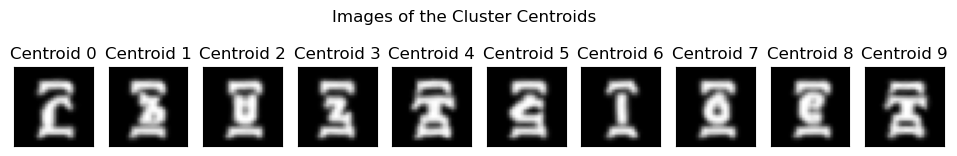

In [129]:
#Set up the plot
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=10, m=1.05, error=1e-6, maxiter=20000, seed=100)

fig, ax = plt.subplots(1, 10, figsize=(12, 2))
plt.suptitle('Images of the Cluster Centroids')

for j in range(0,10):
    #Turn the centroids into a dataframe
    df_centroids=pd.DataFrame(centroids, columns=X_original.columns)
    #First, reshape the flattened 784 pixel array into an 28-by-28 numpy array and unscale the data (ie. multiply by 255)
    object_image = np.array(df_centroids.iloc[j]).reshape((28, 28))*255

    #Then show the image
    ax[j].imshow(object_image, cmap='gray')
    ax[j].grid(False)
    ax[j].set_xticks([])
    ax[j].set_yticks([])
    ax[j].set_title('Centroid %s'%str(j))
plt.show()

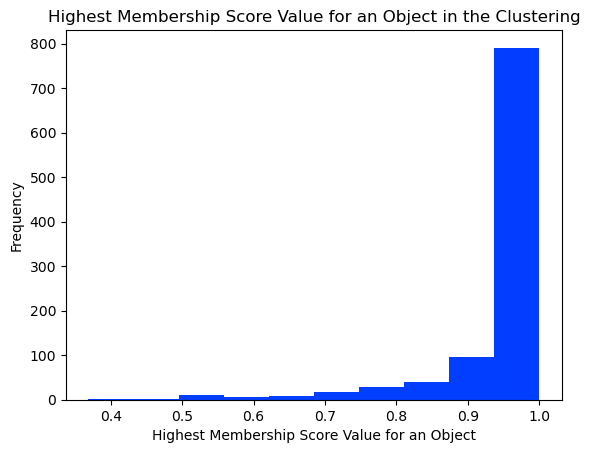

In [130]:
centroids, W, W_0, dist_mat, history, iters, ndpc = cmeans(X_original.T, c=6, m=1.09, error=1e-6, maxiter=20000, seed=100)

cluster_columns=['Cluster %s Membership Score'%(str(i)) for i in range(0,6)]
df_membership=pd.DataFrame(W.T, columns=cluster_columns)
df_membership.round(4)

highest_membership_scores=df_membership.T.max()
highest_membership_scores

plt.hist(highest_membership_scores)
plt.title('Highest Membership Score Value for an Object in the Clustering')
plt.xlabel('Highest Membership Score Value for an Object')
plt.ylabel('Frequency')
plt.show()

## 9. Clustering Algorithm #2: K-means

## Report

For the k-means clustering algorithm, we consult two methods (elbow plot and t-SNE plot) for selecting the number of clusters to apply in the algorithm. According to the elbow plot, we found that there is an obvious elbow at k = 6. Additionally, the labels with 1,2,4,9 are grouped together, and the observations with labels with 6 and 7 are located next to each other in the t-SNE plot. Hence, we consider 6 clusters to be reasonable. Based on the consensus on the optimal number of clusters of these two methods, we determine to use 6 clusters in the k-means clustering algorithm with random state 100.

Our original research motivation is to improve the efficiency of data processing, which reduces the workload of processing large data. Additionally, we are motivated by increasing the accuracy of number identification. Based on this consideration, k-means clustering is meaningful since it provides us with information of which number share higher similarity with specific numbers than others, which directly helps researchers better classify these numbers in the future.

From the cluster-sorted similarity matrix, we can see that most of our clusters are not close to each other, but our silhouette plot for the clusters suggested that our clusters are not cohesive and well-separated since the silhouette is not high for most of the clusters and for 2 of the clusters, we have observation with negative silhouette score, suggest those observations are on average closer to points in a different cluster than to points in its own assigned cluster, suggesting a potential misplacement. When we examine our K nearest neighbor distance plot, we can see that we have a smooth KNN plot without any large jump, indicating that distances between observations are relatively similar across all the clusters and we do not have clusters that have a big difference in sparsity. Since the metric used by similarity matrix and silhouette plot is euclidean distance, which gives big favor to convex clusters. In our dataset, all of the clusters are convex, which implies this won’t become any potential issue if we apply these two techniques in our dataset.  

The dataset could have a big cluster in the middle of this plot. Based on the k-means algorithm, it splits a big cluster into these two clusters(the red one and the brown one). We can see the two clusters in the middle of the t-SNE plot are not well-separated and have some red and brown observations in their gaps. So that is the evidence to suggest the clustering split this inherent cluster. Based on our t-SNE plot, we have evidence and think the brown cluster has two inherent clusters. They are not well-separated, but they have a small gap.


### Elbow plot for K-means

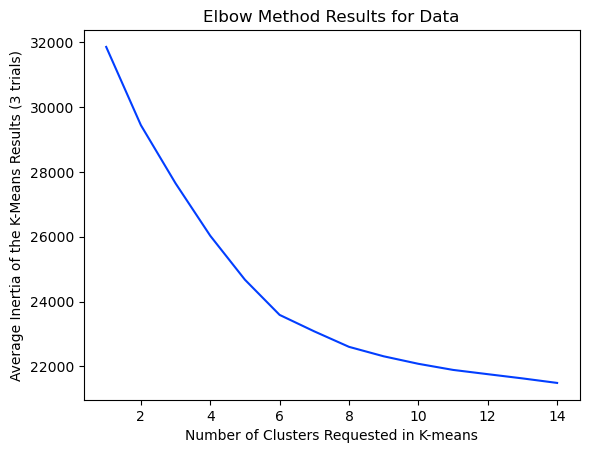

In [131]:
cluster_num_list=range(1,15)
avg_inertia_list=[]
for k in cluster_num_list:
    sub_inertia_list=[]
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(X_original)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))

#Plot it    
plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Data')
plt.show()

### t-SNE plot

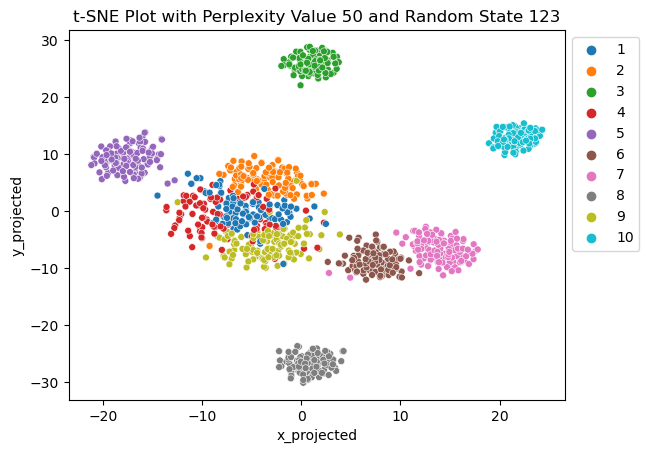

In [132]:
tsne = TSNE(n_components=2, perplexity=50, random_state=123)
data_tsne = tsne.fit_transform(X_original)
df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
df_combo = pd.concat([X_complete, df_tsne], axis=1)
palette = sns.color_palette("tab10")  
sns.scatterplot(x='x_projected',y='y_projected', hue='label', data=df_combo, s=25, alpha=1, palette=palette)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(50, 123))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

### Clustering the Data

In [133]:
df_copy_2 = df_copy.copy()
kmeans = KMeans(n_clusters=6, random_state=100).fit(X_original)
df_copy_2['predicted_cluster']=kmeans.labels_
df_copy_2.head()

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783,label,predicted_cluster
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,3
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,3


In [134]:
#Create the t-SNE plot projected coordinates
tsne = TSNE(n_components=2, perplexity=50, random_state=123)
data_tsne = tsne.fit_transform(X_original)
df_tsne = pd.DataFrame(data_tsne, columns=['x', 'y'])
df_combo = pd.concat([df_copy_2, df_tsne], axis=1)
df_combo

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783,label,predicted_cluster,x,y
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,2,-18.417463,11.095155
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2,3,-6.074015,4.781730
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,2,-16.894150,9.578834
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8,1,1.989365,-25.330502
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1,3,-8.105542,3.046021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,2,-15.774959,13.785980
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8,1,-1.051883,-29.284048
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,10,0,19.837820,11.441961
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,2,-18.600243,11.403155


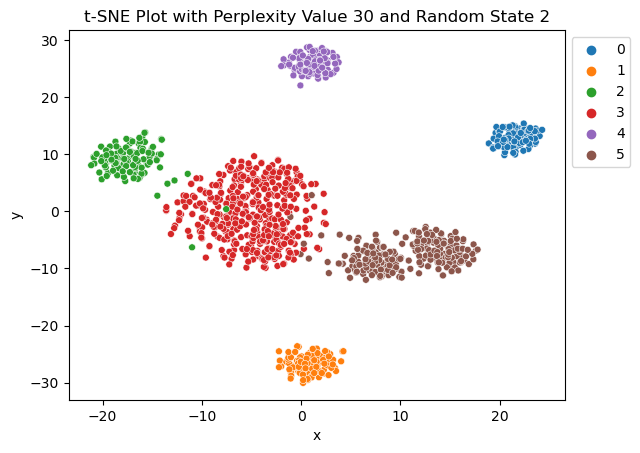

In [135]:
palette = sns.color_palette("tab10")  
sns.scatterplot(x='x', y='y', hue='predicted_cluster', data=df_combo, s=25, alpha=1, palette=palette)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' % (30, 2))
plt.legend(bbox_to_anchor=(1, 1))
plt.show()

In [136]:
df_sort=df_copy_2.sort_values(by=['predicted_cluster'])
df_sort=df_sort.drop(['label', 'predicted_cluster'], axis=1)
df_sort

,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,pixel_9,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
718,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
838,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
840,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
766,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
858,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
481,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
238,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


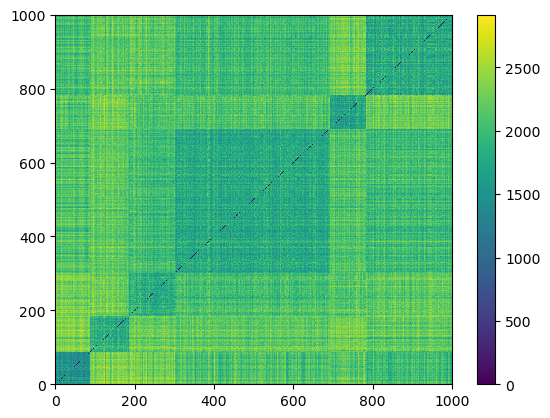

In [137]:
#Create a distance matrix
dist_mat = squareform(pdist(df_sort))

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

For n_clusters = 6 The average silhouette_score is : 0.12049462192586023


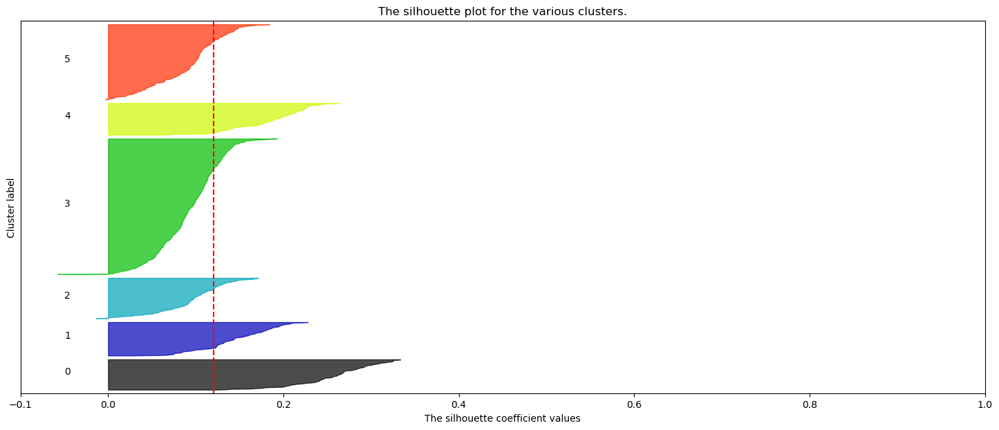

In [138]:
def show_silhouette_plots(X, cluster_labels):
    # This package allows us to use "color maps" in our visualizations
    import matplotlib.cm as cm

    # How many clusters in your clustering?
    n_clusters = len(np.unique(cluster_labels))

    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

    return

show_silhouette_plots(X_original,df_copy_2['predicted_cluster'])

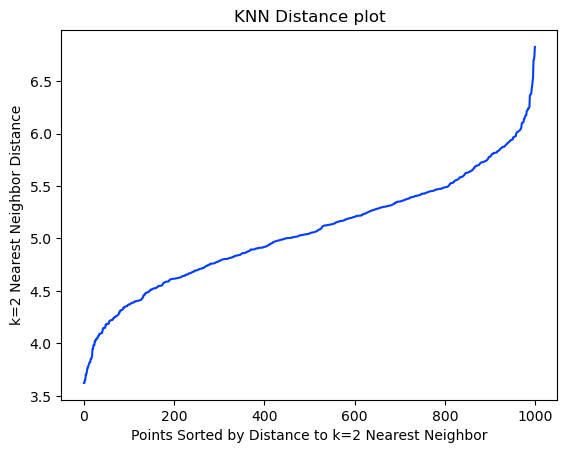

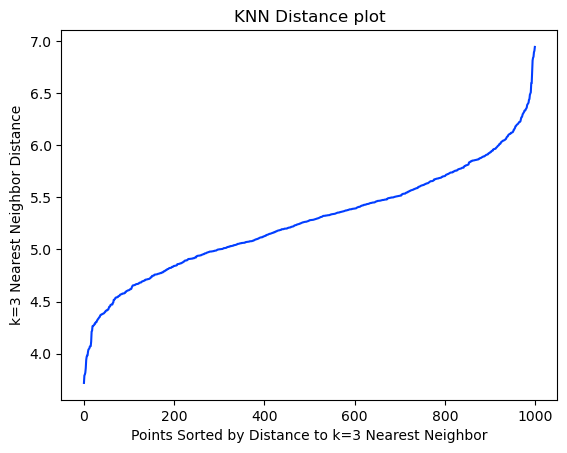

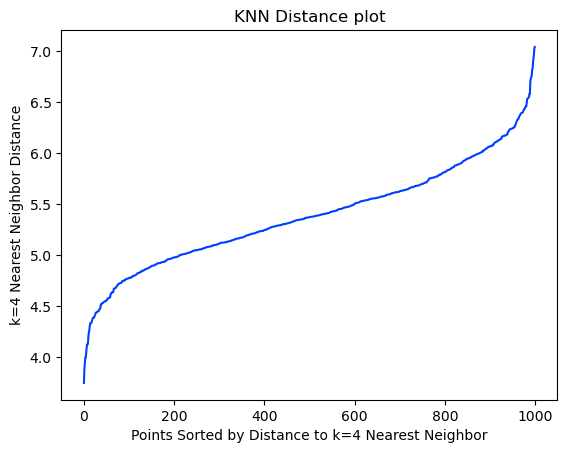

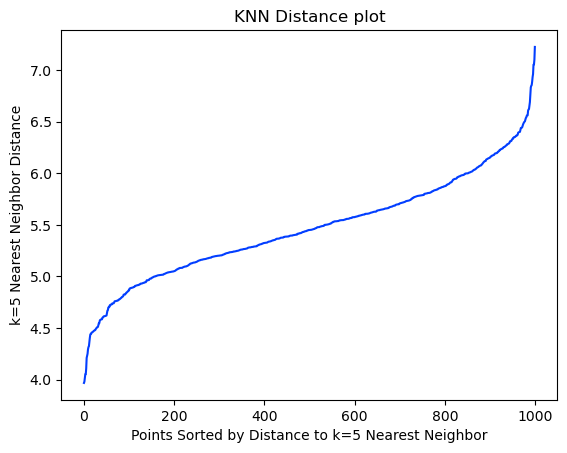

In [139]:
for k in range(2,6):
    nbrs = NearestNeighbors(n_neighbors=6, algorithm='ball_tree').fit(X_original)
    distances, indices = nbrs.kneighbors(X_original)

    plt.plot(np.sort(distances.T[k-1]))

    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('KNN Distance plot')
    plt.show()

In [140]:
df_copy_2['predicted_cluster'].value_counts().sort_index().cumsum()

predicted_cluster
0      88
1     185
2     302
3     692
4     784
5    1000
Name: count, dtype: int64

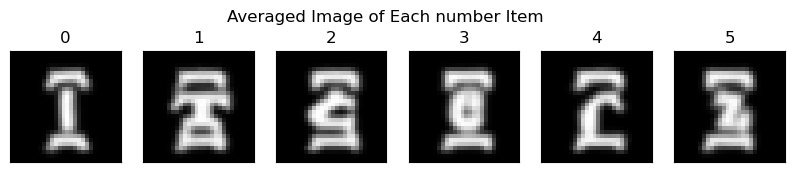

In [159]:
num_list_1=df_copy_2['predicted_cluster'].drop_duplicates()

df_item_averages=df_copy_2.drop(['label'],axis=1).groupby(['predicted_cluster']).mean()

#Set up the plot
i=0
fig, ax = plt.subplots(1, 6, figsize=(10, 2))
plt.suptitle('Averaged Image of Each number Item')

for num in sorted(list(num_list_1)):
    #First, reshape the flattened 784 pixel array into an 28-by-28 numpy array and unscale the data (ie. multiply by 255)
    object_image = np.array(df_item_averages.loc[num]).reshape((28, 28))*255

    #Then show the image
    ax[i].imshow(object_image, cmap='gray')
    ax[i].grid(False)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
    ax[i].set_title(str(num))
    
    i+=1
plt.show()

## 10. Discussion

### Report

Adjusted Rand Score measures the accuracy of clustering. Adjusted Rand Score close to 1 indicates that the clusters generated by the algorithm perfectly match the true clusters. Adjusted Rand Score close to 0 suggests that the clustering is no better than a random assignment, and Adjusted Rand Score smaller than 0 indicates that the clustering is worse than would be expected by random chance. The Adjusted Rand Score of K-means clustering is 0.5101238821297055, and the Adjusted Rand Score of fuzzy-c means is 0.5085806470907352, which implies both methods have moderate accuracy in clustering the number.

The t-SNE plots color-coded by the cluster labels of k-means and fuzzy c means clustering algorithms are almost the same. If we hard-assign the class in fuzzy c means based on their highest membership for each observation, the predicted label of k-means clustering and fuzzy c means will be close to each other. 

We do not think that one of these clustering algorithms was better able to identify all the "inherent" clusters, since the t-SNE plots of both algorithms are akin to each other and there is no reason to believe one algorithm outperforms another. Given outliers do not exist within this dataset, the performance of both algorithms is similar even though both are sensitive to outliers. 

We do not believe that one of these clustering algorithms was better at identifying all the "inherent" clusters, as the t-SNE plots of both algorithms are similar and there is no reason to believe that one algorithm outperforms the other. Since there are no outliers in this data set, the performance of both algorithms is similar, although both are sensitive to outliers. 

Since from the t-sne plot, we know that there are some straddle nodes in our dataset, we go with fuzzy c-means clustering, an algorithm that has better performance when encountering straddle nodes, and we have evidence to believe our clustering result is meaningful.


There are some insights revealed by k-means but not by fuzzy c-means clusterings. First of all, k-means utilize a hard assignment technique, which provides a certain assignment of the clusters of each observation, which is greatly helpful when we want to find out which exact cluster a number label is. Additionally, k-means clustering is a time and computing efficient clustering method, which greatly aligns with our research motivation in reducing the workload of processing large scale image data. 

The output of fuzzy c-means is a fuzzy clustering membership score. It is a soft membership assignment. It allows each observation to belong to multiple clusters. This gives you more information. K-means only allows each observation to belong to one cluster. Additioanlly, it helps identify straddle nodes and overlap of clusters. For example, in our project, some numbers look similar. They have some straddle nodes and overlap.

### k-means clustering 

In [160]:
kmeans=KMeans(n_clusters=6, random_state=100).fit(X_original)
df['predicted_cluster']=kmeans.labels_
adjusted_rand_score(df['predicted_cluster'], df['label'])

0.5101238821297055

### Fuzzy-c mean

In [208]:
centroids, W, W_0, dist_maat, history, iters, ndpc = cmeans(X_original.T, c=6, m=1.05, error=1e-6, maxiter=20000, seed=100)
W_new = pd.DataFrame(W).T
W_df = pd.DataFrame(W.T)
W_df['predicted_cluster'] = W_df.apply(lambda row: row.argmax(), axis=1)
adjusted_rand_score(W_df['predicted_cluster'], df['label'])

0.5085806470907352

## 11. Conclusion

In our report, we are dedicated to improving the efficiency of data processing and accuracy of object identification in the image dataset. To attain our goal, we apply two clustering algorithms: Fuzzy C-Mean and K-Means to learn more thoroughly about the artificially generated Ethiopic number image dataset. According to the analysis, we found the image of numbers with labels 1,2,4,9 and 6 and 7 have high structural similarity, which makes the final clustering of 6 a reasonable outcome.


Our research has shown that some of the Ge'ez (Ethiopic) numbers have a high degree of structural similarity, such as the numbers 1, 2, 4, 9, and the numbers 6 and 7. Therefore, researchers need to take extra care when classifying new Ge'ez (Ethiopic) numbers, especially when encountering numbers with similar structures to the above to ensure the accuracy and reliability of the clustering results.


Whilst we conducted comprehensive analysis to this image data by applying two clustering algorithms, there are some shortcomings of our analysis. First of all, our data is complete without any missing value and outliers, which greatly reduces the workload of preprocessing the original dataset. In real life scenarios, the missingness and outlier is a common issue within the image dataset. What is the proper way to handle this situation before analyzing data is an important issue needed to consider when handling real data and is what we didn’t consider in our study. Additionally, our image data is artificially generated, where the pixel of each number locates at the center of the image, which makes the direct comparison readily implementable. In real life, in contrast, the handwriting style of each person varies to a large degree. That is said, the location of the main body of the number might be left, right corner instead of center, which add the difficulty when analyzing the image similar what we did in our analysis. 

One of the motivations of our study is to help researchers better identify the Ethiopic number in the future, which pertains to supervised learning, and the first and important step within supervised learning is understanding the dataset more thoroughly. For instance, supervised learning models usually leverage the preassign labeled from unsupervised learning as explanatory variable to predict the label for each new observation, where our analysis algorithm and result can be applied to. Additionally, our analysis reveals the underlying structure of the dataset, which provides insights for selecting the appropriate machine learning methods in the future.